In [ ]:
%matplotlib notebook
%matplotlib inline

import librosa
import librosa.display

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

from sklearn.decomposition import FastICA, NMF
np.random.seed(0)

# Wonderwall &mdash; Oasis

## Preparation 

Let's load our track:

In [2]:
guitar, rate = librosa.load('data/track1/guitar.wav')
vocals, _ = librosa.load('data/track1/vocal.wav')
bass, _ = librosa.load('data/track1/bass.wav')
drums, _ = librosa.load('data/track1/drums.wav')
strings, _ = librosa.load('data/track1/strings+guitar.wav')

Instruments' spectrogram:

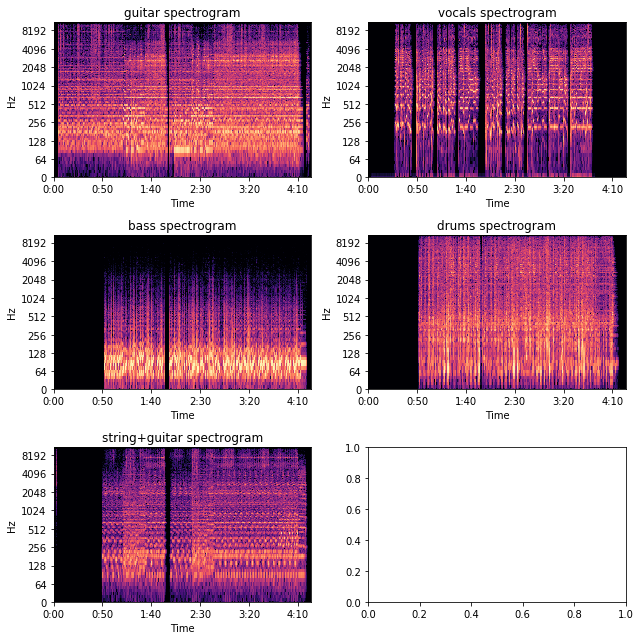

In [3]:
fig, axes = plt.subplots(figsize=(9, 9), nrows=3, ncols=2)

for track, name, ax in zip([guitar, vocals, bass, drums, strings], 
                           ['guitar', 'vocals', 'bass', 'drums', 'string+guitar'], 
                           axes.flatten()):
    track_amp = librosa.stft(track)
    track_db = librosa.amplitude_to_db(np.abs(track_amp), ref=np.max)
    
    librosa.display.specshow(track_db, y_axis='log', x_axis='time', ax=ax)
    ax.set_title(f'{name} spectrogram')
    
plt.tight_layout()

Listen to it now:

In [6]:
track = guitar+vocals+bass+percussion
Audio(track, rate=rate)

Track spectrogram:

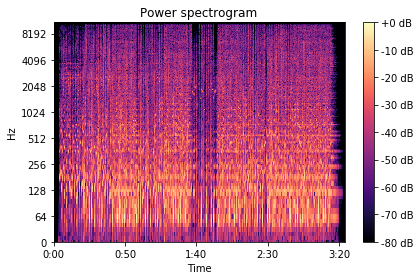

In [7]:
track_amp = librosa.stft(track)
track_db = librosa.amplitude_to_db(np.abs(track_amp), ref=np.max)

plt.figure()
librosa.display.specshow(track_db, y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

Source signals:

In [4]:
S = np.c_[guitar, vocals, bass, drums, strings]

Random mixing matrix that emulates recording from 4 microphones at different lcoations:

In [8]:
A = np.random.random(size=(5, 5))
A = A / A.sum(axis=0)

Observed signals:

In [9]:
X = S @ A

In [10]:
def normalize(X):
    return (X - np.min(X))/(np.max(X) - np.min(X))

Normalize X to make it from 0 to 1 (requirement of NMF)

In [11]:
X = normalize(X)

Now let's listen to them as well:

In [ ]:
Audio(X[..., 0], rate=rate)

In [ ]:
Audio(X[..., 1], rate=rate)

In [ ]:
Audio(X[..., 2], rate=rate)

In [ ]:
Audio(X[..., 3], rate=rate)

## FastICA

In [12]:
ica = FastICA(n_components=5)

# as simple as invoking a single function:
Shat = ica.fit_transform(X)

Let's give a listen to what the algorithm has found:

In [ ]:
Audio(Shat[..., 0], rate=rate)

In [ ]:
Audio(Shat[..., 1], rate=rate)

In [ ]:
Audio(Shat[..., 2], rate=rate)

In [ ]:
Audio(Shat[..., 3], rate=rate)

In [ ]:
Audio(Shat[..., 4], rate=rate)

Tracks sound almost perfectly fine. Even string+guitar was separated.

Let's look on the spectrogram again:

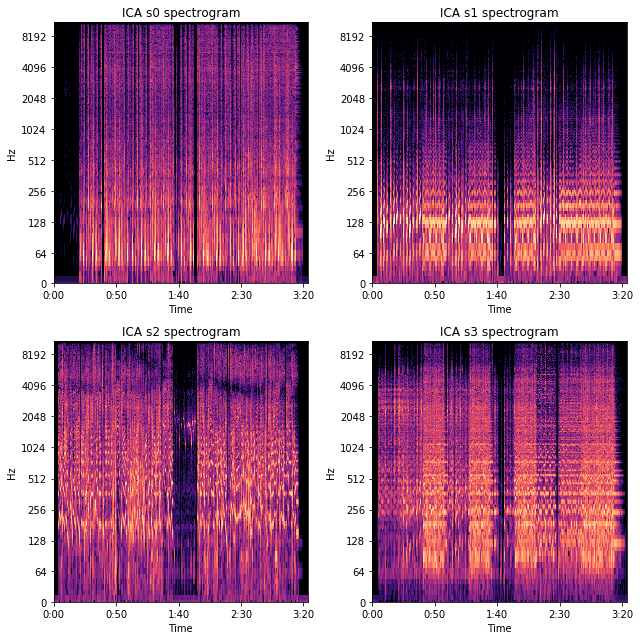

In [59]:
fig, axes = plt.subplots(figsize=(9, 9), nrows=3, ncols=2)

for k, ax in enumerate(axes.flatten()):
    track_amp = librosa.stft(Shat[..., k].copy())
    track_db = librosa.amplitude_to_db(np.abs(track_amp), ref=np.max)
    
    librosa.display.specshow(track_db, y_axis='log', x_axis='time', ax=ax)
    ax.set_title(f'ICA s{k} spectrogram')
    
plt.tight_layout()

## NNMF

### 1. Separation using `NMF`

In [ ]:
from sklearn.decomposition import NMF

nmf = NMF(
    n_components=5,
    max_iter=300,
    random_state=42,
    solver='mu',
    init='nndsvda',
    alpha=2,
    beta_loss='kullback-leibler',
    verbose=True
)

W = nmf.fit_transform(X)
H = nmf.components_

### 2. Filtering

In [41]:
alpha = 1

W_0 = W[:, 0].reshape(-1, 1)
H_0 = H[:, 0].reshape(-1, 1)

W_1 = W[:, 1].reshape(-1, 1)
H_1 = H[:, 1].reshape(-1, 1)


W_2 = W[:, 2].reshape(-1, 1)
H_2 = H[:, 2].reshape(-1, 1)


W_3 = W[:, 3].reshape(-1, 1)
H_3 = H[:, 3].reshape(-1, 1)

W_4 = W[:, 4].reshape(-1, 1)
H_4 = H[:, 4].reshape(-1, 1)

W_sum = np.sum(
    [
        (W[:, i].reshape(-1, 1) @ H[:, i].reshape(-1, 1).T)**alpha for i in range(W.shape[1])
    ])

M_0 = ((W_0 @ H_0.T)**alpha)/W_sum
M_1 = ((W_1 @ H_1.T)**alpha)/W_sum
M_2 = ((W_2 @ H_2.T)**alpha)/W_sum
M_3 = ((W_3 @ H_3.T)**alpha)/W_sum
M_4 = ((W_4 @ H_4.T)**alpha)/W_sum

In [42]:
X_0 = np.multiply(M_0, X)
X_1 = np.multiply(M_1, X)
X_2 = np.multiply(M_2, X)
X_3 = np.multiply(M_3, X)
X_4 = np.multiply(M_4, X)

### 3. ISTFT

In [43]:
x_0 = librosa.core.istft(X_0.T)
x_1 = librosa.core.istft(X_1.T)
x_2 = librosa.core.istft(X_2.T)
x_3 = librosa.core.istft(X_3.T)
x_4 = librosa.core.istft(X_4.T)

### 4. Results

In [ ]:
Audio(x_0, rate=rate)

In [ ]:
Audio(x_1, rate=rate)

In [ ]:
Audio(x_2, rate=rate)

In [ ]:
Audio(x_3, rate=rate)

In [ ]:
Audio(x_4, rate=rate)

Expectedly, the spectrogram is complete mess with no clearly distinguishable tracks.

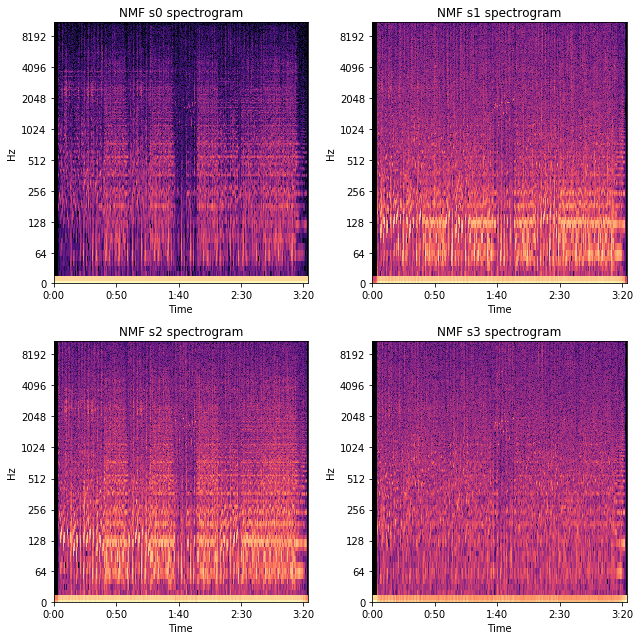

In [57]:
fig, axes = plt.subplots(figsize=(9, 9), nrows=3, ncols=2)

for k, ax in enumerate(axes.flatten()):
    track_amp = librosa.stft(W[..., k].copy())
    track_db = librosa.amplitude_to_db(np.abs(track_amp), ref=np.max)
    
    librosa.display.specshow(track_db, y_axis='log', x_axis='time', ax=ax)
    ax.set_title(f'NMF s{k} spectrogram')
    
plt.tight_layout()